# Regression Predict Team 7

© Explore Data Science Academy

---

## Team Members
    
- 1. Lucky Uyi
- 2. Michael Kanu
- 3. Winfred Mutinda
- 4. Nurudeen Isah
- 5. Fanayajo Olusegun


### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [1]:
pip install xgboost

In [2]:
# Libraries for data loading, data manipulation and data visualisation
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Libraries for data preparation and model building
from dataprep.eda import create_report, plot, plot_correlation
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import ols
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [3]:
df = pd.read_csv('df_train.csv')
df.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667


In [40]:
df_test = pd.read_csv('df_test.csv')
df_test.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
0,8763,1/1/2018 0:00,5.000000,level_8,0.0,5.000000,87.0,71.333333,20.0,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.38,286.816667,285.15,283.15,279.866667,279.15
1,8764,1/1/2018 3:00,4.666667,level_8,0.0,5.333333,89.0,78.000000,0.0,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.01,283.483333,284.15,281.15,279.193333,278.15


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [5]:
#Lets view the structure of our data
print(df.shape)
print(df_test.shape) 

(8763, 49)
(2920, 48)


**Obviously our test data is one column short. Which is due to the omission of the targer feature

In [6]:
# Print summary statistics
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,8763.0,4381.000000,2529.804538,0.000000,2190.500000,4381.000000,6571.500000,8.762000e+03
Madrid_wind_speed,8763.0,2.425729,1.850371,0.000000,1.000000,2.000000,3.333333,1.300000e+01
Bilbao_rain_1h,8763.0,0.135753,0.374901,0.000000,0.000000,0.000000,0.100000,3.000000e+00
Valencia_wind_speed,8763.0,2.586272,2.411190,0.000000,1.000000,1.666667,3.666667,5.200000e+01
Seville_humidity,8763.0,62.658793,22.621226,8.333333,44.333333,65.666667,82.000000,1.000000e+02
Madrid_humidity,8763.0,57.414717,24.335396,6.333333,36.333333,58.000000,78.666667,1.000000e+02
Bilbao_clouds_all,8763.0,43.469132,32.551044,0.000000,10.000000,45.000000,75.000000,1.000000e+02
Bilbao_wind_speed,8763.0,1.850356,1.695888,0.000000,0.666667,1.000000,2.666667,1.266667e+01
Seville_clouds_all,8763.0,13.714748,24.272482,0.000000,0.000000,0.000000,20.000000,9.733333e+01
Bilbao_wind_deg,8763.0,158.957511,102.056299,0.000000,73.333333,147.000000,234.000000,3.593333e+02


In [7]:
# Checking statistical for outliers
df.kurtosis()

C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  


Unnamed: 0                -1.200000
Madrid_wind_speed          2.036462
Bilbao_rain_1h            32.904656
Valencia_wind_speed       35.645426
Seville_humidity          -1.017983
Madrid_humidity           -1.167537
Bilbao_clouds_all         -1.533417
Bilbao_wind_speed          3.631565
Seville_clouds_all         2.155921
Bilbao_wind_deg           -1.083530
Barcelona_wind_speed       1.493635
Barcelona_wind_deg        -0.959160
Madrid_clouds_all          0.142079
Seville_wind_speed         1.398580
Barcelona_rain_1h        101.578931
Seville_rain_1h           93.840746
Bilbao_snow_3h           806.128471
Barcelona_pressure      3687.564230
Seville_rain_3h          413.136592
Madrid_rain_1h            76.584491
Barcelona_rain_3h        187.800460
Valencia_snow_3h        4089.323165
Madrid_weather_id          9.259047
Barcelona_weather_id       5.701882
Bilbao_pressure            1.825323
Seville_weather_id        10.710308
Valencia_pressure          2.211823
Seville_temp_max          -0

** We can see some crazy values for BARCELONIA PRESSURE,VALENCIA SNOW, BILBAO SNOW, etc. We will need some visuals to explore better for more insights **

In [8]:
# We will use the dataprep library to aid our eploration with some good visuals
report = create_report(df, title='Team7_SpainLoadShortFall')

  0%|                                                | 0/12236 [00:00<?, ?it/s]

Team7_SpainLoadShortFall
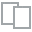
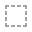
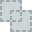
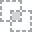
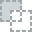
...
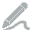
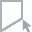
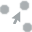
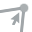
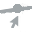

In [9]:
report

### Observations From Our EDA

    - An 'Unnamed 0' feature exist which seems like serial number and need to be dropped
    - There are unusual high values in 'Barcelona_Pressure' ranging over 1million, which definitely are outliers and need to be removed
    - The high values observed in the kurtosis analysis for features like 'Bilbao_snow','Valencia_snow' might not necessarily be ouliers as those fields have very high zero counts, hence other values seem like outliers
    - Valencia_wind_deg and Seville Pressure are categorical in contracts with their peers in other regions. They need to be converted to numerical variables
    - We observed some missing values in Valencia_pressure feature, so this needs to be treated
    - The time feature seems too rigid in its correct form, we might have to break it down further into bits to help understand our data better
    - The max and min temperature feature appears to have very high correlation with the temperature in all our regions, we might have to drop max and min temp across our regions
    

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [10]:
# Impute the missing values with mean imputation
df['Valencia_pressure'].fillna(value = df['Valencia_pressure'].mean(), inplace=True )

In [11]:
#drop s/no column
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [12]:
# Make time columns datetime format

df['time'] = pd.to_datetime(df['time'], utc=False)

In [13]:
#Create new features from the time variable
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['day'] = df['time'].dt.day
df['hour'] = df['time'].dt.hour
df['weekday'] = df['time'].dt.weekday
df['week'] = df['time'].dt.week

C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  import sys


In [15]:
# In other to clean up the outliers in barcelona_pressure, we need to know the median. 
# This is because the median is not sensitive to outliers and would be a best value to fill with.

median = df['Barcelona_pressure'].median()
median

1018.0

In [16]:
# Next we replace every value greater then the highest standard atmosperic pressure(1084) with the median calculated above

df.loc[df['Barcelona_pressure']>1084.0,'Barcelona_pressure'] = df['Barcelona_pressure'].median()

In [17]:
df['Barcelona_pressure'].describe()

count    8763.000000
mean     1017.870117
std         9.229795
min       670.666667
25%      1014.000000
50%      1018.000000
75%      1022.000000
max      1039.000000
Name: Barcelona_pressure, dtype: float64

In [18]:
# Lets take a look at the kurtosis for barcelona_pressure
df['Barcelona_pressure'].kurtosis()

460.920549005735

In [19]:
# remove correlated  temperature features since temp is the aveg of temp_min and temp_max, we will drop temp_max and temp_min
col = ['Madrid_temp_max','Valencia_temp_max','Barcelona_temp_max','Bilbao_temp_max','Seville_temp_max',
      'Madrid_temp_min','Valencia_temp_min','Barcelona_temp_min','Bilbao_temp_min','Seville_temp_min']
df = df.drop(col,axis=1)

In [20]:
# Lets take a look at our dataset so far
df.head(2)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Barcelona_temp,Bilbao_temp,Madrid_temp,load_shortfall_3h,year,month,day,hour,weekday,week
0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,...,281.013000,269.338615,265.938000,6715.666667,2015,1,1,3,3,1
1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,...,280.561667,270.376000,266.386667,4171.666667,2015,1,1,6,3,1


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 44 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   time                  8763 non-null   datetime64[ns]
 1   Madrid_wind_speed     8763 non-null   float64       
 2   Valencia_wind_deg     8763 non-null   object        
 3   Bilbao_rain_1h        8763 non-null   float64       
 4   Valencia_wind_speed   8763 non-null   float64       
 5   Seville_humidity      8763 non-null   float64       
 6   Madrid_humidity       8763 non-null   float64       
 7   Bilbao_clouds_all     8763 non-null   float64       
 8   Bilbao_wind_speed     8763 non-null   float64       
 9   Seville_clouds_all    8763 non-null   float64       
 10  Bilbao_wind_deg       8763 non-null   float64       
 11  Barcelona_wind_speed  8763 non-null   float64       
 12  Barcelona_wind_deg    8763 non-null   float64       
 13  Madrid_clouds_all 

In [22]:
# set time as the index since we have already broken it down into bits..... To avoid duplicate data

df.set_index('time', inplace=True)
df.sort_index(inplace=True)
df.head(2)

,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Barcelona_temp,Bilbao_temp,Madrid_temp,load_shortfall_3h,year,month,day,hour,weekday,week
time,,,,,,,,,,,,,,,,,,,,,
2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,223.333333,...,281.013000,269.338615,265.938000,6715.666667,2015,1,1,3,3,1
2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,221.000000,...,280.561667,270.376000,266.386667,4171.666667,2015,1,1,6,3,1


Note: The time column as been converted to index column. 

In [23]:
# Convert 'Valencia_wind_deg','Seville_pressure' to numerical via pd.get_dummy

df = pd.get_dummies(df,columns=['Valencia_wind_deg','Seville_pressure'],
                               drop_first=True)


In [24]:
df.head(2)


,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Seville_pressure_sp23,Seville_pressure_sp24,Seville_pressure_sp25,Seville_pressure_sp3,Seville_pressure_sp4,Seville_pressure_sp5,Seville_pressure_sp6,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9
time,,,,,,,,,,,,,,,,,,,,,
2015-01-01 03:00:00,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,223.333333,6.333333,...,0,0,1,0,0,0,0,0,0,0
2015-01-01 06:00:00,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,221.000000,4.000000,...,0,0,1,0,0,0,0,0,0,0


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8763 entries, 2015-01-01 03:00:00 to 2017-12-31 21:00:00
Data columns (total 74 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Madrid_wind_speed           8763 non-null   float64
 1   Bilbao_rain_1h              8763 non-null   float64
 2   Valencia_wind_speed         8763 non-null   float64
 3   Seville_humidity            8763 non-null   float64
 4   Madrid_humidity             8763 non-null   float64
 5   Bilbao_clouds_all           8763 non-null   float64
 6   Bilbao_wind_speed           8763 non-null   float64
 7   Seville_clouds_all          8763 non-null   float64
 8   Bilbao_wind_deg             8763 non-null   float64
 9   Barcelona_wind_speed        8763 non-null   float64
 10  Barcelona_wind_deg          8763 non-null   float64
 11  Madrid_clouds_all           8763 non-null   float64
 12  Seville_wind_speed          8763 non-null   float64
 1

In [26]:
## Lets rearrange the columns for our train data

column_titles = [col for col in df.columns if col!= 'load_shortfall_3h'] + ['load_shortfall_3h']
df=df.reindex(columns=column_titles)

In [27]:
df.head(2)

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Seville_pressure_sp24,Seville_pressure_sp25,Seville_pressure_sp3,Seville_pressure_sp4,Seville_pressure_sp5,Seville_pressure_sp6,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9,load_shortfall_3h
time,,,,,,,,,,,,,,,,,,,,,
2015-01-01 03:00:00,0.666667,0.0,0.666667,74.333333,64.000000,0.0,1.0,0.0,223.333333,6.333333,...,0,1,0,0,0,0,0,0,0,6715.666667
2015-01-01 06:00:00,0.333333,0.0,1.666667,78.333333,64.666667,0.0,1.0,0.0,221.000000,4.000000,...,0,1,0,0,0,0,0,0,0,4171.666667


In [28]:
#Replace outliers with the median
def replace_outlier(val, mean, std,median):
    if val > mean + 3*std:
        return median
    elif val < mean - 3*std:
        return median
    return val

In [29]:
for col in df.columns:
    if df[col].dtype == 'float64':
        mean = df[col].mean()
        median = df[col].median()
        std_dev = df[col].std(axis=0)
        df[col] = df[col].map(lambda x: replace_outlier(x, mean, std_dev,median))

In [31]:
df.kurtosis()

Madrid_wind_speed        0.736341
Bilbao_rain_1h           7.984467
Valencia_wind_speed      1.375523
Seville_humidity        -1.017983
Madrid_humidity         -1.167537
                          ...    
Seville_pressure_sp6    16.380407
Seville_pressure_sp7    45.408917
Seville_pressure_sp8    16.024031
Seville_pressure_sp9    42.931751
load_shortfall_3h       -0.171478
Length: 74, dtype: float64

In [39]:
# Lets put all our preprocess steps into a function. This will help clean any test data to suite our model


def preprocess_code(df):
    df_new = df.copy()
    # Impute the missing values with mean imputation
    df_new['Valencia_pressure'].fillna(value = df_new['Valencia_pressure'].mean(), inplace=True )
    #drop s/no column
    df_new.drop(['Unnamed: 0'], axis=1, inplace=True)
    # Make time columns datetime format
    df_new['time'] = pd.to_datetime(df_new['time'], utc=False)
    #Create new features from the time variable
    df_new['year'] = df_new['time'].dt.year
    df_new['month'] = df_new['time'].dt.month
    df_new['day'] = df_new['time'].dt.day
    df_new['hour'] = df_new['time'].dt.hour
    df_new['weekday'] = df_new['time'].dt.weekday
    df_new['week'] = df_new['time'].dt.week
    # remove correlated  temperature features since temp is the aveg of temp_min and temp_max, we will drop temp_max and temp_min
    col = ['Madrid_temp_max','Valencia_temp_max','Barcelona_temp_max','Bilbao_temp_max','Seville_temp_max',
          'Madrid_temp_min','Valencia_temp_min','Barcelona_temp_min','Bilbao_temp_min','Seville_temp_min']
    df_new = df_new.drop(col,axis=1)
    # set time as the index since we have already broken it down into bits..... To avoid duplicate data
    df_new.set_index('time', inplace=True)
    df_new.sort_index(inplace=True)
    # Convert 'Valencia_wind_deg','Seville_pressure' to numerical via pd.get_dummy
    df_new = pd.get_dummies(df_new,columns=['Valencia_wind_deg','Seville_pressure'],
                                   drop_first=True)
    #Replace outliers with the median
    def replace_outlier(val, mean, std,median):
        if val > mean + 3*std:
            return median
        elif val < mean - 3*std:
            return median
        return val
    for col in df_new.columns:
        if df_new[col].dtype == 'float64':
            mean = df_new[col].mean()
            median = df_new[col].median()
            std_dev = df_new[col].std(axis=0)
            df_new[col] = df_new[col].map(lambda x: replace_outlier(x, mean, std_dev,median))
            
    return df_new
    
    
    

In [41]:
df2 = df.copy()
df_t2 = df_test.copy()

In [42]:
new_df_test = preprocess_code(df_t2)

C:\Users\User\anaconda3\lib\site-packages\ipykernel_launcher.py:15: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  from ipykernel import kernelapp as app


In [43]:
new_df_test.head(2)

,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,Barcelona_wind_speed,...,Seville_pressure_sp23,Seville_pressure_sp24,Seville_pressure_sp25,Seville_pressure_sp3,Seville_pressure_sp4,Seville_pressure_sp5,Seville_pressure_sp6,Seville_pressure_sp7,Seville_pressure_sp8,Seville_pressure_sp9
time,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,5.000000,0.0,5.000000,87.0,71.333333,20.0,3.000000,0.0,193.333333,4.000000,...,0,0,1,0,0,0,0,0,0,0
2018-01-01 03:00:00,4.666667,0.0,5.333333,89.0,78.000000,0.0,3.666667,0.0,143.333333,4.666667,...,0,0,1,0,0,0,0,0,0,0


<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [69]:
# create targets and features dataset

X = df2.drop(['load_shortfall_3h'], axis=1)
y = df2['load_shortfall_3h']

In [70]:
# Create standardization object
scaler = StandardScaler()

In [71]:
# Save standardized features into new variable
X_scaled = scaler.fit_transform(X)
# y2 = y.to_numpy()
# y_scaled = scaler.fit_transform(y2.reshape(-1,1))

In [72]:
from sklearn.model_selection import train_test_split

In [73]:
#split into train and test

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2,random_state =21 , shuffle=True)

In [49]:
# create one or more ML models

name = ['LinearReg', 'Ridge', 'Lasso','Random_Forest','SVR_Lin','SVR_RBF','XBoost']

regressors = [LinearRegression(), Ridge(), Lasso(), RandomForestRegressor(),SVR(kernel="linear", C=10, gamma="auto"),
             SVR(kernel="rbf", C=10, gamma="auto"),XGBRegressor()]

In [53]:
from sklearn import metrics
# create models
result = []
models = {}
for n, reg in zip(name,regressors):
    print('Fitting {} model...'.format(name))
    run_time = %timeit -q -o reg.fit(X_train,y_train)
    print('.....Predicting')
    y_pred = reg.predict(X_test)
    
    
    print('....Scoring')
    rmse_test = np.sqrt(metrics.mean_squared_error(y_test,y_pred))
    
    
    #Saving result to dictionary
    models[n] = reg
    result.append([n, rmse_test,run_time.best])
    
result =pd.DataFrame(result, columns = ['Regressor', 'Test_RMSE','Train_time'])
result.set_index('Regressor', inplace = True)

Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring
Fitting ['LinearReg', 'Ridge', 'Lasso', 'Random_Forest', 'SVR_Lin', 'SVR_RBF', 'XBoost'] model...
.....Predicting
....Scoring


In [55]:
# evaluate one or more ML models

result.sort_values('Test_RMSE', ascending=True)

,Test_RMSE,Train_RMSE,Train_time
Regressor,,,
XBoost,2586.902852,997.363140,2.520565
Random_Forest,2785.085658,1012.681029,80.275279
LinearReg,4601.973271,4707.384418,0.053653
Lasso,4605.686715,4708.410749,0.444143
Ridge,4606.106114,4708.043625,0.061186
SVR_Lin,4631.580774,4754.249339,115.842286
SVR_RBF,5080.661005,5231.517793,42.565203


RandomForestRegressor()

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [64]:

# Compare model performance
result.sort_values('Test_RMSE', ascending=True)

,Test_RMSE,Train_RMSE,Train_time
Regressor,,,
XBoost,2586.902852,997.363140,2.520565
Random_Forest,2785.085658,1012.681029,80.275279
LinearReg,4601.973271,4707.384418,0.053653
Lasso,4605.686715,4708.410749,0.444143
Ridge,4606.106114,4708.043625,0.061186
SVR_Lin,4631.580774,4754.249339,115.842286
SVR_RBF,5080.661005,5231.517793,42.565203


<AxesSubplot:xlabel='Regressor'>

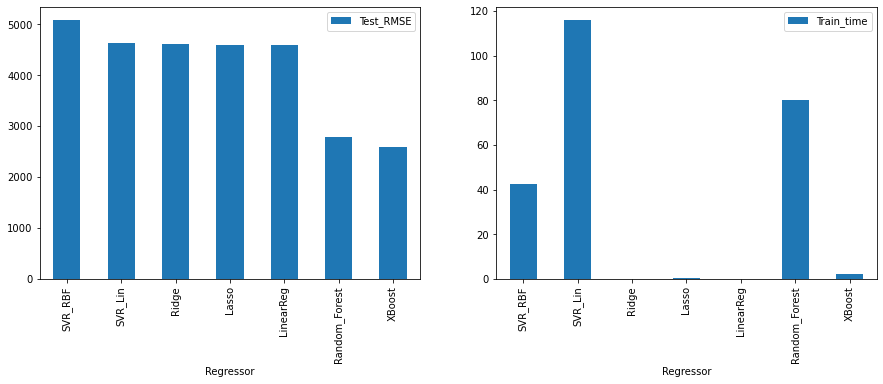

In [85]:
# Choose best model and motivate why it is the best choice
fig, ax = plt.subplots(1,2,figsize=(15,5))
result.sort_values('Test_RMSE', ascending=False, inplace=True)
result.plot(y=['Test_RMSE'], kind = 'bar',ax=ax[0] )
result.plot(y='Train_time', kind = 'bar',ax=ax[1])

In [ ]:
Xbg_model = XGBRegressor()
RF_model = RandomForestRegressor()

In [ ]:
Xbg_model.fit(X_train,y_train)
RF_model.fit(X_train,y_train)

In [ ]:
xbg_pred = Xbg_model.predict(new_df_test)
rf_pred = RF_model.predict(new_df_test)

In [ ]:
output4 = pd.DataFrame({'time': new_df_test.index, 'load_shortfall_3h': xbg_pred}) 
output4.to_csv('sub_xbg55.csv', index=False)

In [ ]:
# Pickle random forest model for use within our API  
import pickle 

save_path = 'load_shortfall_simple_rf_model.pkl'
print (f"Training completed. Saving model to: {save_path}")
pickle.dump(RF_model, open(save_path,'wb'))

In [90]:
# Pickle xboost model for use within our API 

save_path = 'load_shortfall_simple_xboost_model.pkl'
print (f"Training completed. Saving model to: {save_path}")
pickle.dump(Xbg_model, open(save_path,'wb'))

Training completed. Saving model to: load_shortfall_simple_xboost_model.pkl


In [126]:
output5 = pd.DataFrame({'time': df_test.index, 'load_shortfall_3h': ridge_1l}) 
output5.to_csv('submissionridge22.csv', index=False)

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic

